In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [4]:
# import csv file
df = pd.read_csv('images_infos_until_biobank.csv')

#print header
print(df.head())


                                            img_path contrast orientation  \
0  basel-mp2rage\sub-C001\anat\sub-C001_UNIT1.nii.gz    UNIT1         ASL   
1  basel-mp2rage\sub-C002\anat\sub-C002_UNIT1.nii.gz    UNIT1         ASL   
2  basel-mp2rage\sub-C003\anat\sub-C003_UNIT1.nii.gz    UNIT1         ASL   
3  basel-mp2rage\sub-C005\anat\sub-C005_UNIT1.nii.gz    UNIT1         ASL   
4  basel-mp2rage\sub-C006\anat\sub-C006_UNIT1.nii.gz    UNIT1         ASL   

             shape  is_2D  is_3D  is_4D                p  
0  (176, 240, 256)  False   True  False  (1.0, 1.0, 1.0)  
1  (176, 240, 256)  False   True  False  (1.0, 1.0, 1.0)  
2  (176, 240, 256)  False   True  False  (1.0, 1.0, 1.0)  
3  (176, 240, 256)  False   True  False  (1.0, 1.0, 1.0)  
4  (176, 240, 256)  False   True  False  (1.0, 1.0, 1.0)  


# Simple charts

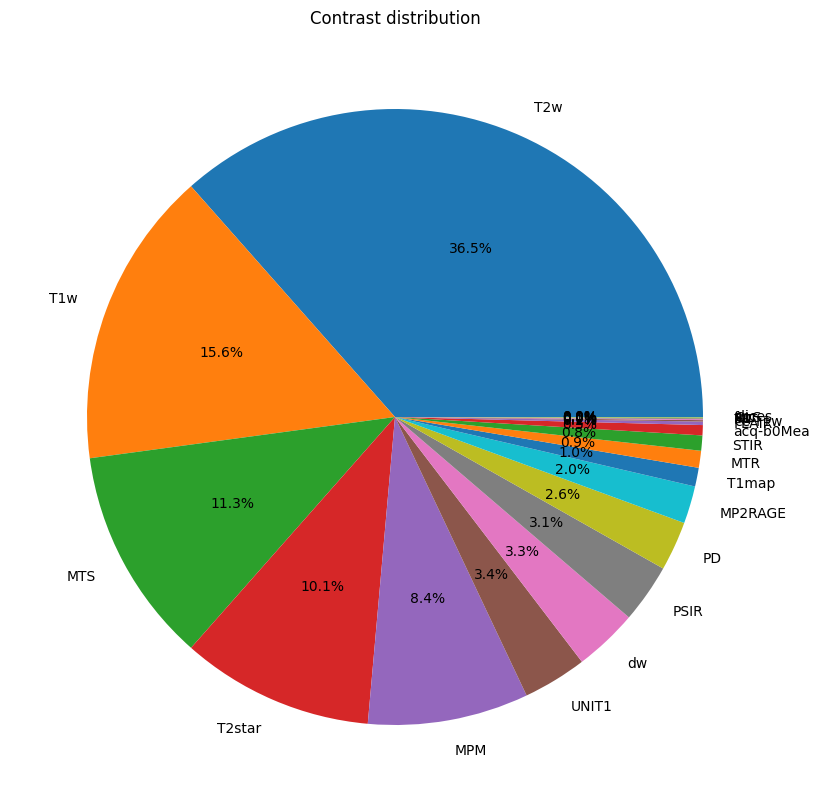

In [5]:
# column_names = ["img_path","contrast","orientation","shape","is_2D","is_3D","is_4D","p"]
column_names = df.columns

# build a pie charts of the contrats
plt.figure(figsize=(10,10))
plt.pie(df['contrast'].value_counts(),labels=df['contrast'].value_counts().index,autopct='%1.1f%%')
plt.title('Contrast distribution')
plt.show()

In [76]:
# make a pie chart that visualize the share of images with is_2D == True, is_3D == True, is_4D == True
plt.figure(figsize=(10,10))
nb_2D = df['is_2D'].sum()
nb_3D = df['is_3D'].sum()
nb_4D = df['is_4D'].sum()
plt.pie([nb_2D,nb_3D,nb_4D],labels=['2D','3D','4D'],autopct='%1.1f%%')
plt.title('Image type distribution')
plt.show()



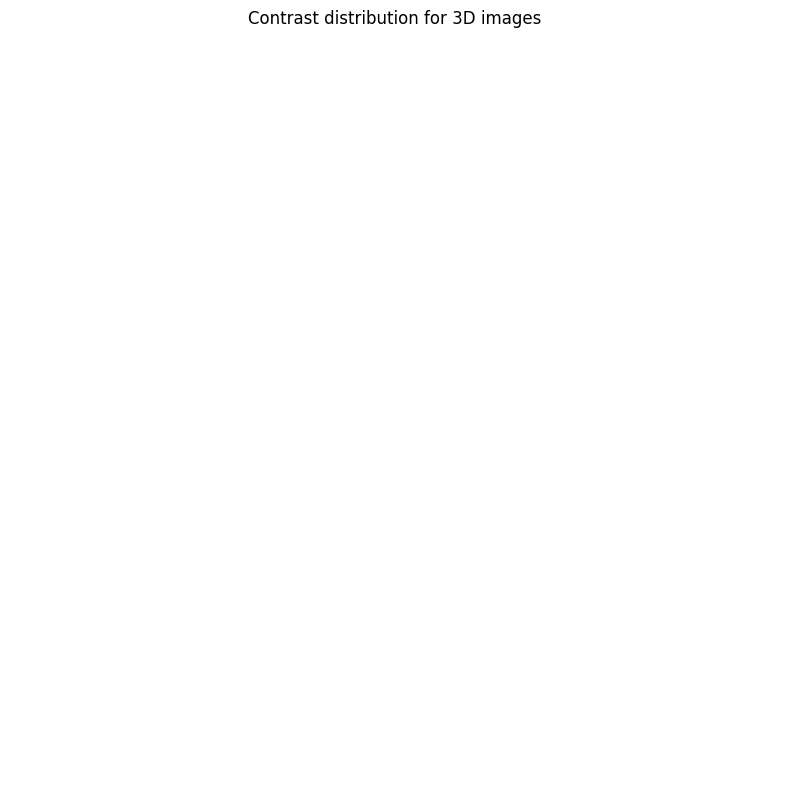

In [ ]:
# build a pie charts of the contrats for 3D images only
plt.figure(figsize=(10,10))
plt.pie(df[df['is_3D']==1]['contrast'].value_counts(),labels=df[df['is_3D']==1]['contrast'].value_counts().index,autopct='%1.1f%%')
plt.title('Contrast distribution for 3D images')
plt.show()

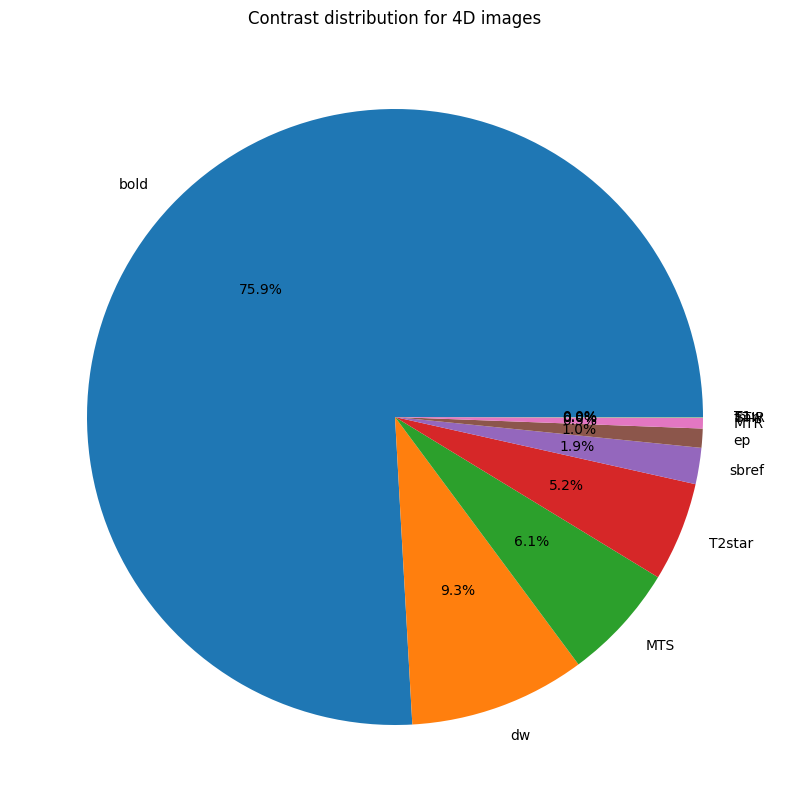

In [ ]:
# build a pie charts of the contrats for 4D images only
plt.figure(figsize=(10,10))
plt.pie(df[df['is_4D']==1]['contrast'].value_counts(),labels=df[df['is_4D']==1]['contrast'].value_counts().index,autopct='%1.1f%%')
plt.title('Contrast distribution for 4D images')
plt.show()

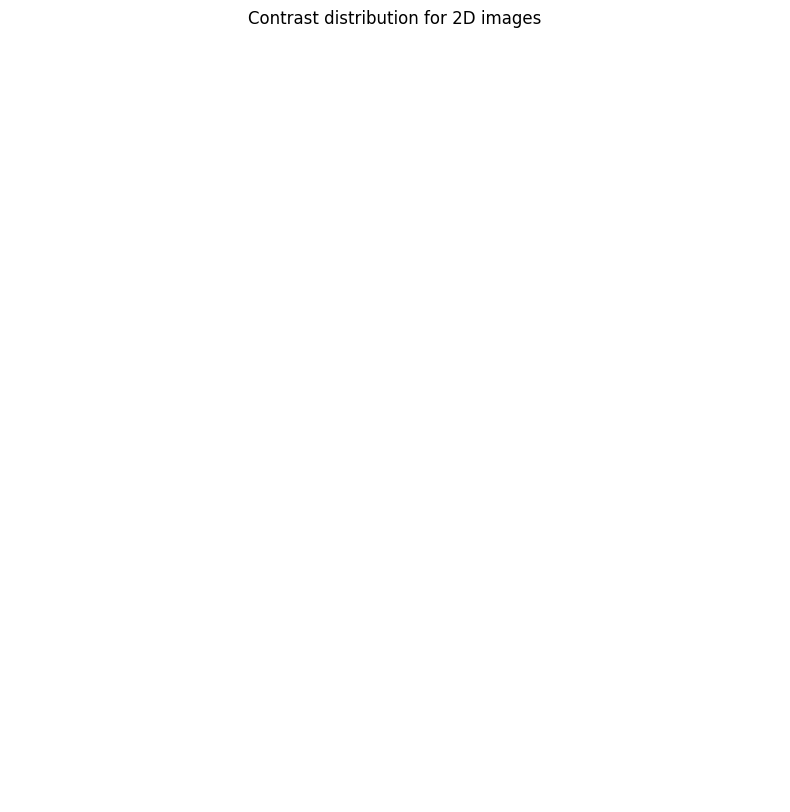

In [ ]:
# build a pie charts of the contrats for 2D images only
plt.figure(figsize=(10,10))
plt.pie(df[df['is_2D']==1]['contrast'].value_counts(),labels=df[df['is_2D']==1]['contrast'].value_counts().index,autopct='%1.1f%%')
plt.title('Contrast distribution for 2D images')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


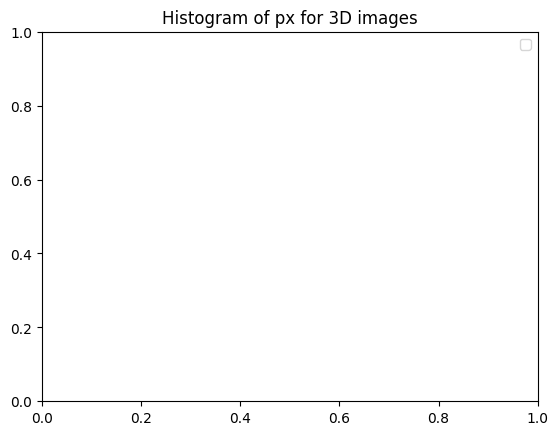

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


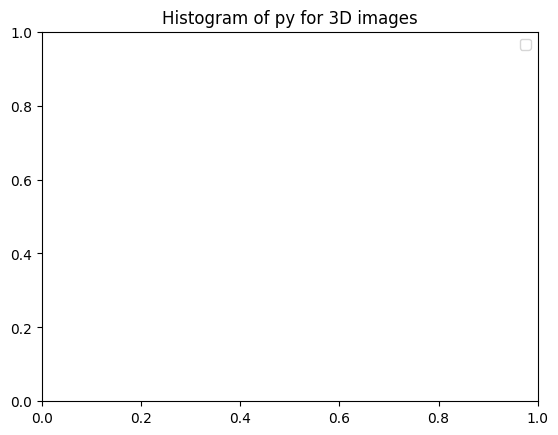

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


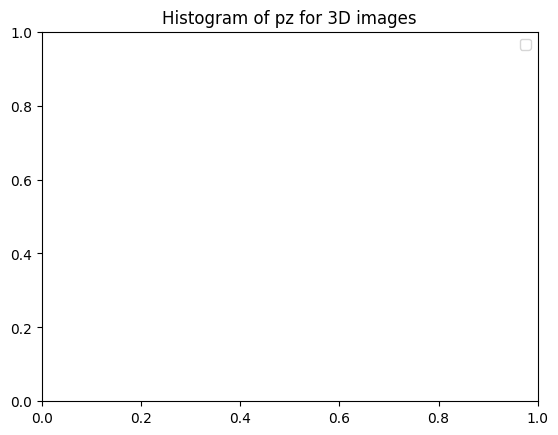

In [ ]:
# plot an histogramme of value of px, py, pz for 3D images
df_3D = df[df['is_3D']==1]
contrasts = df_3D['contrast'].unique()
bin_edges = list(np.arange(0,10,0.1))
for contrast in contrasts :
    plt.hist(df_3D[df_3D['contrast']==contrast]['px'],alpha=0.5,label=contrast, bins = bin_edges)
plt.legend()
plt.title('Histogram of px for 3D images')
plt.show()

for contrast in contrasts :
    plt.hist(df_3D[df_3D['contrast']==contrast]['py'],alpha=0.5,label=contrast, bins = bin_edges)
plt.legend()
plt.title('Histogram of py for 3D images')
plt.show()

for contrast in contrasts :
    plt.hist(df_3D[df_3D['contrast']==contrast]['pz'],alpha=0.5,label=contrast, bins = bin_edges)
plt.legend()
plt.title('Histogram of pz for 3D images')
plt.show()
    

In [11]:
def get_dataset(path):
    if '\s' in path:
        return(path.split('\s')[0])
    else:
        return(path.split('/')[0])

df['dataset'] = df['img_path'].apply(get_dataset)

3113


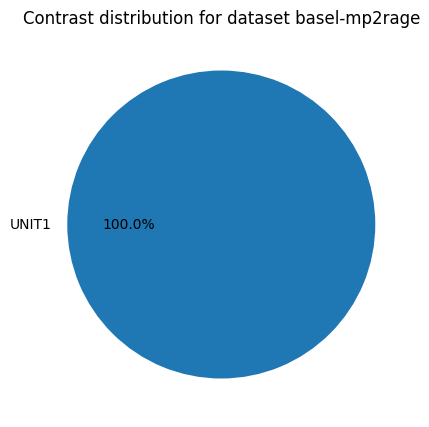

11


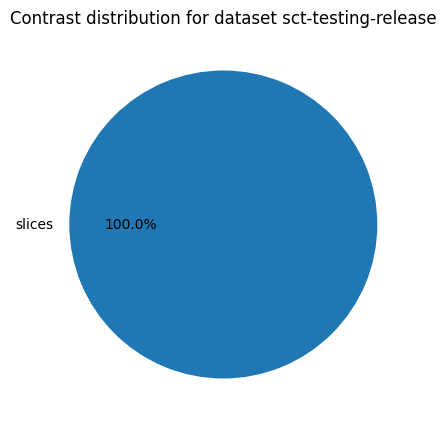

49940


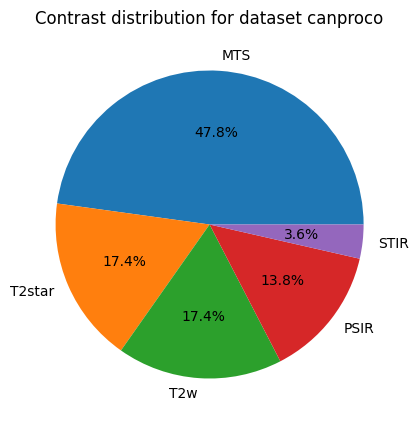

220


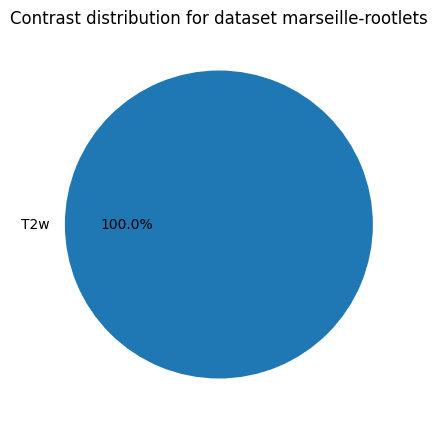

3355


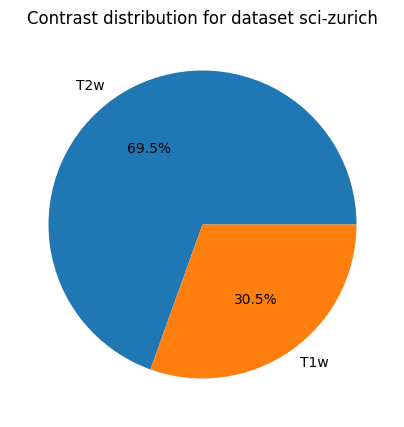

10989


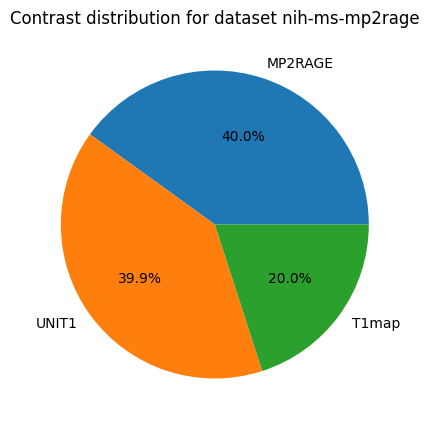

1320


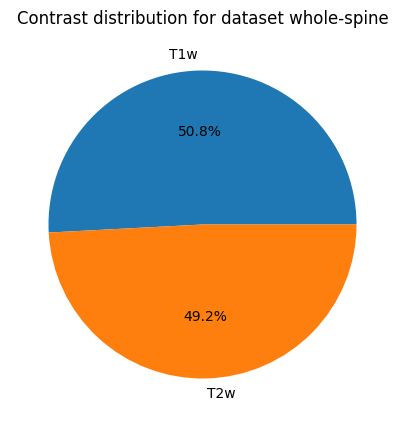

32010


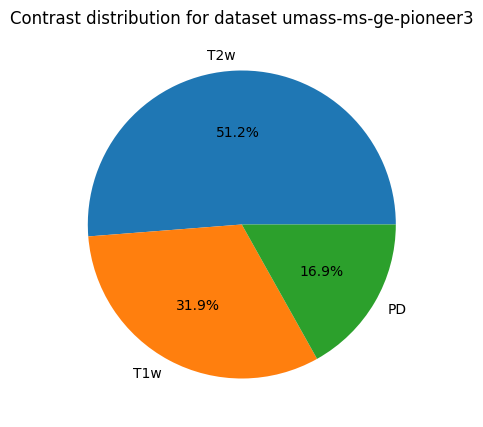

1518


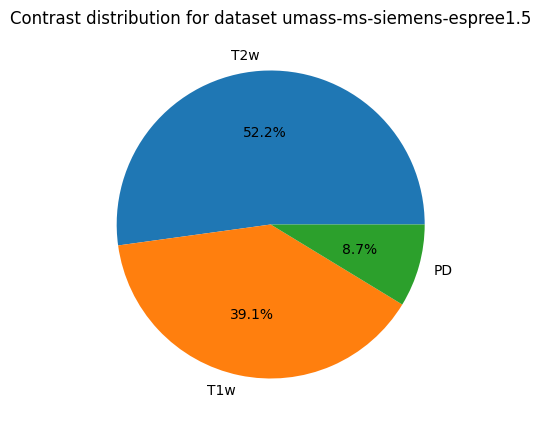

1727


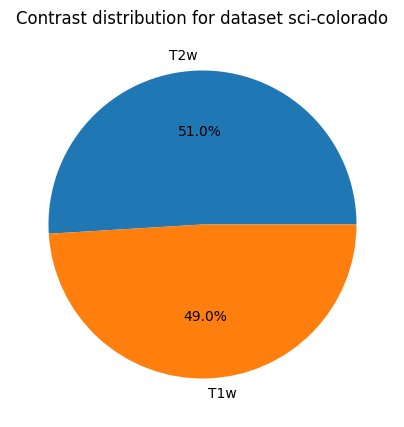

4917


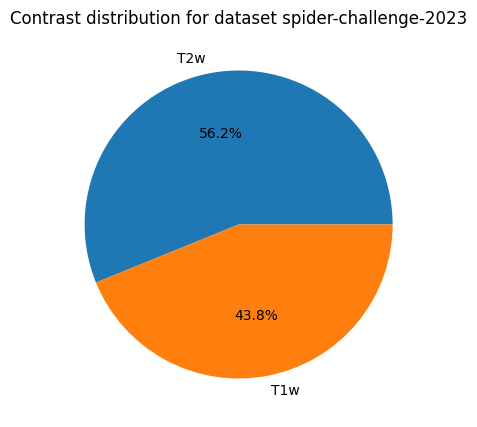

154


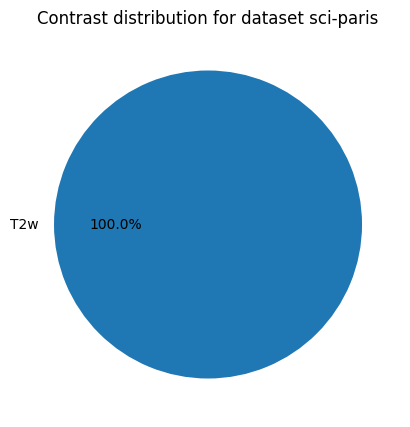

41921


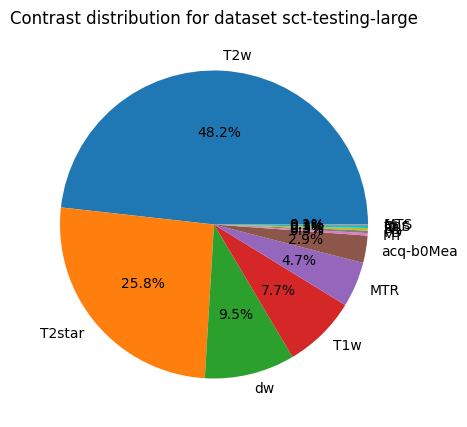

825


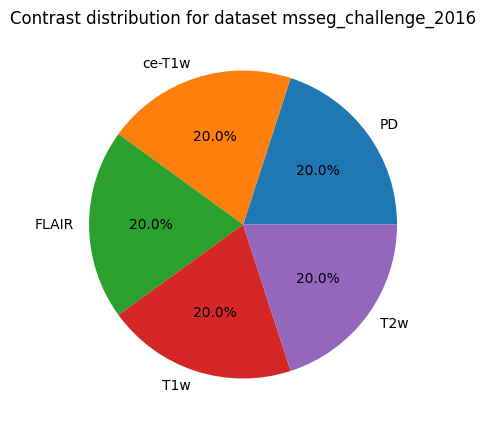

1111


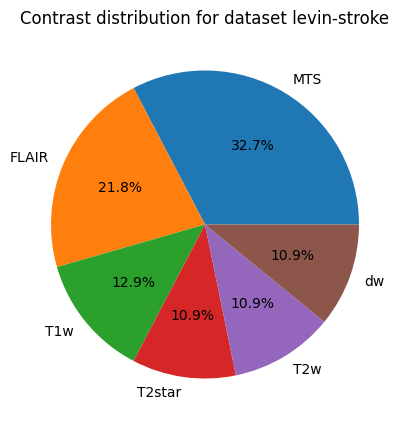

1507


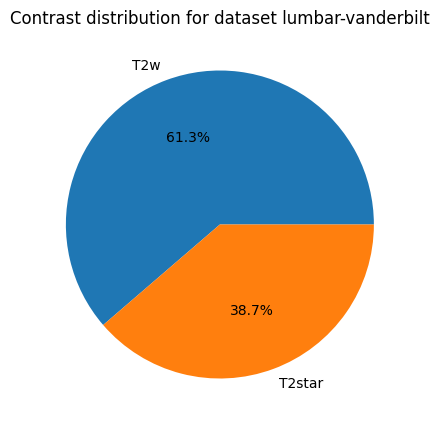

275


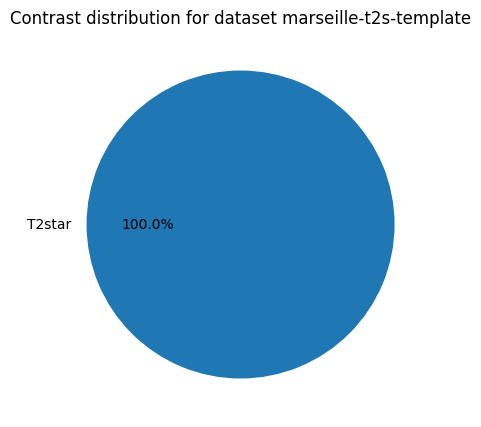

121


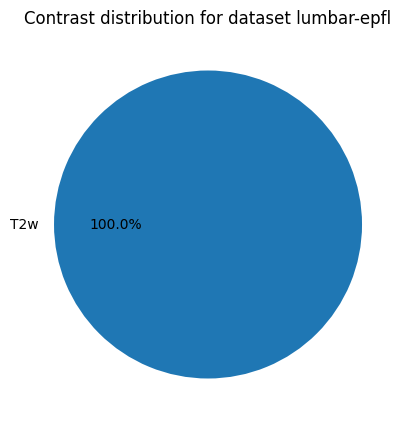

25212


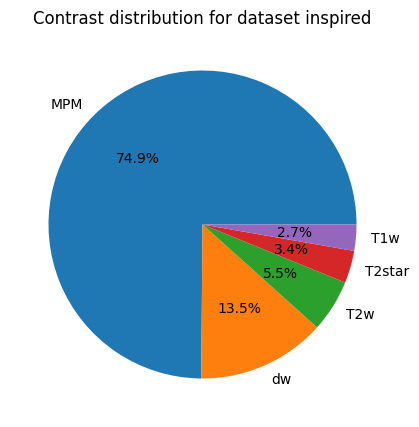

6160


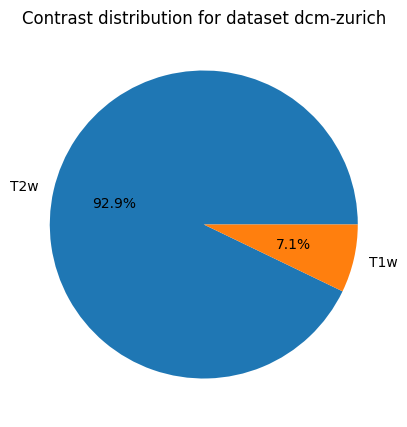

154


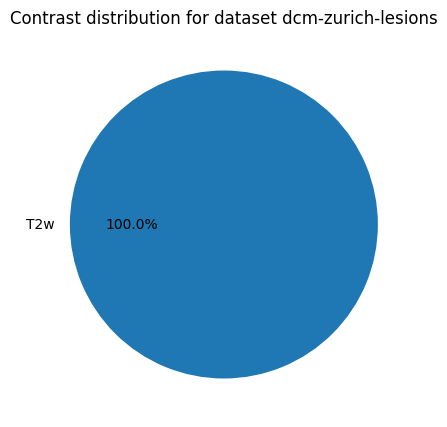

880


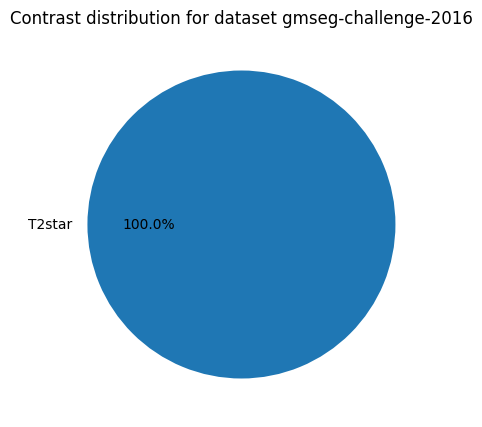

1859


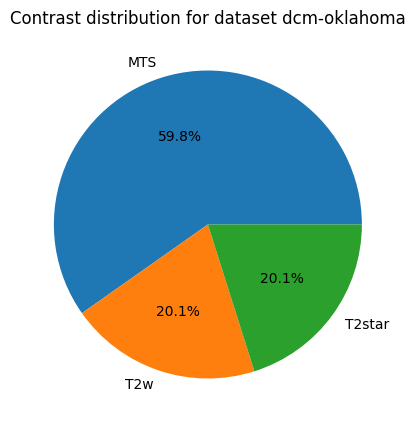

7766


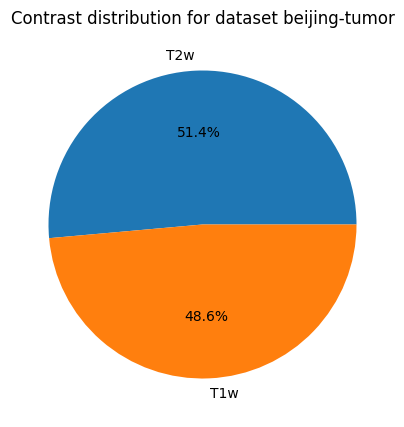

4686


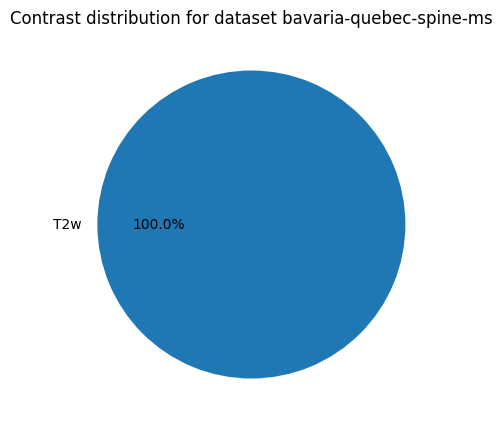

22000


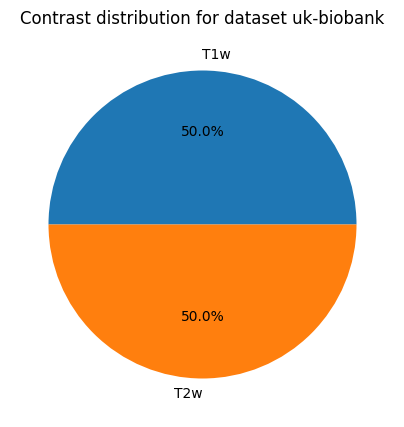

880


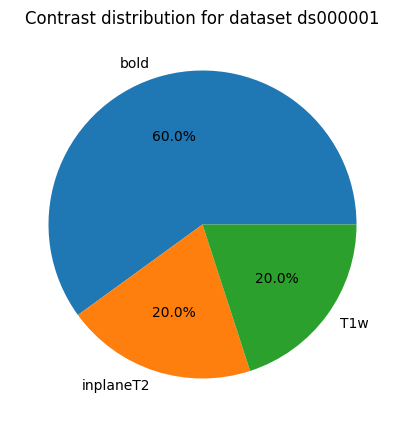

1496


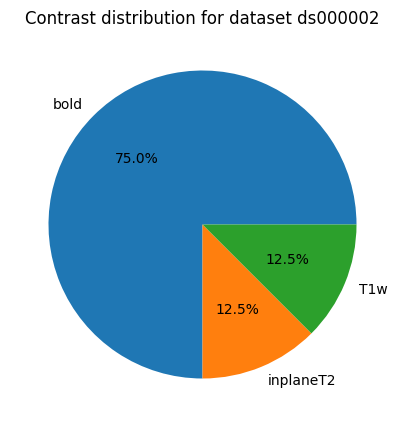

429


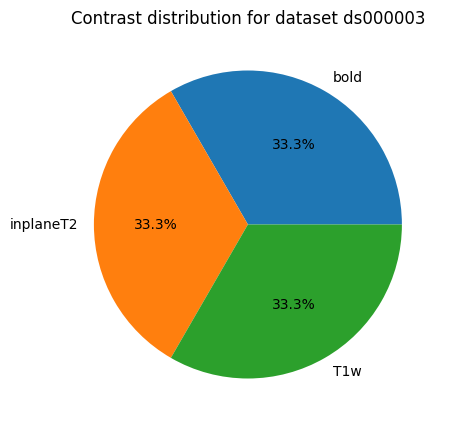

880


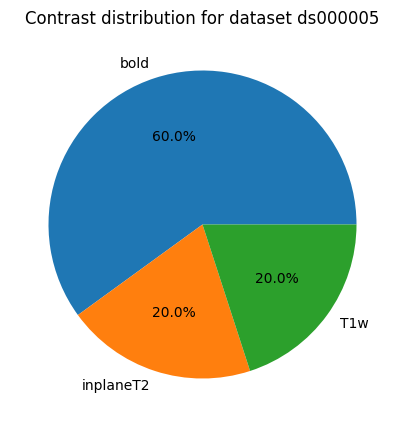

2398


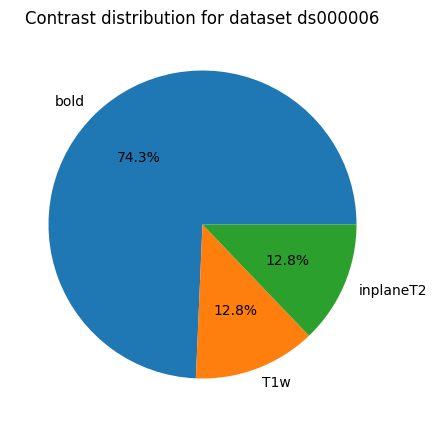

1738


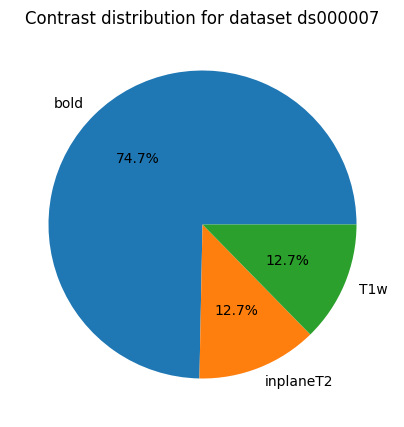

1166


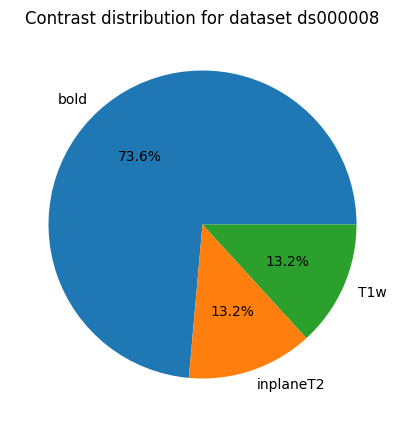

2376


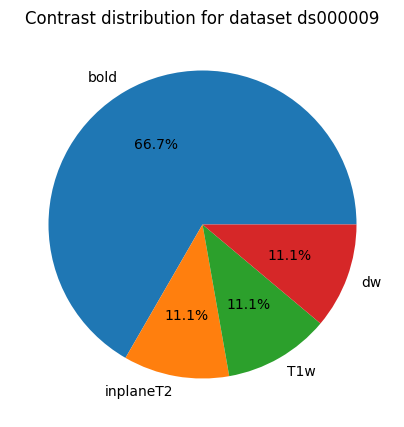

1221


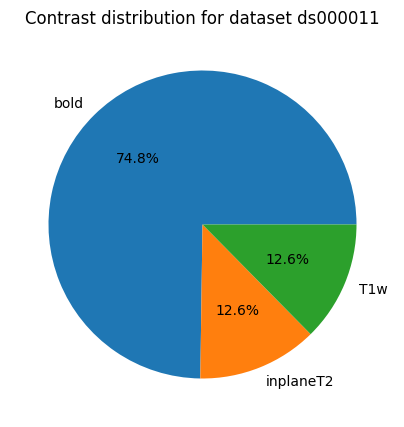

1342


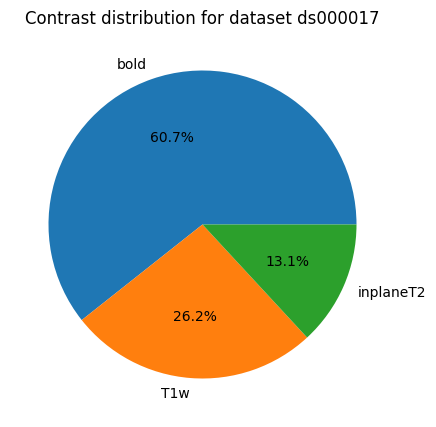

27841


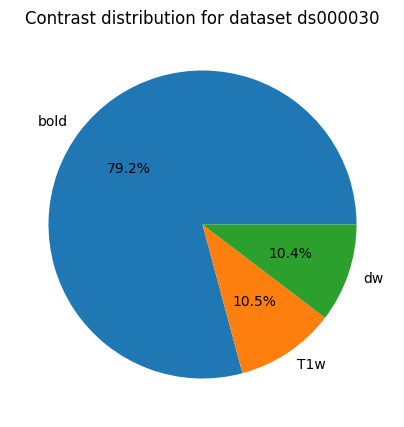

7315


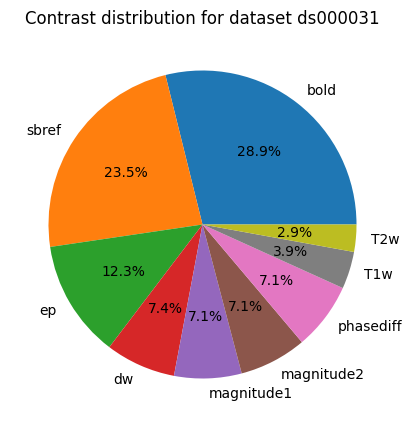

1573


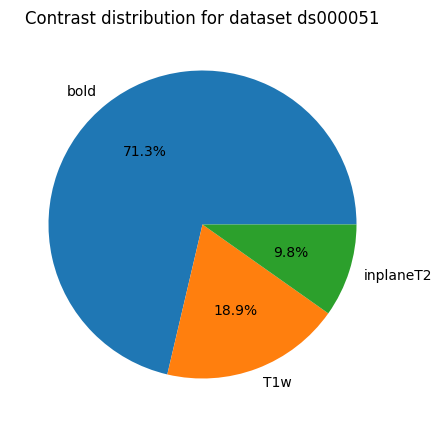

990


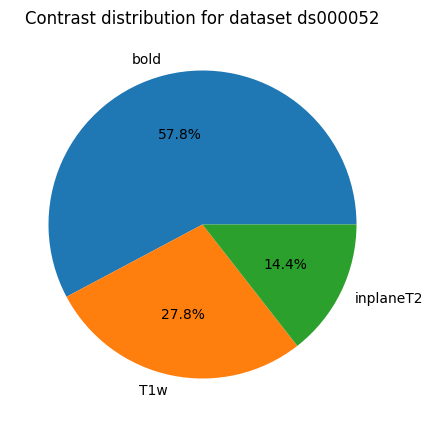

5841


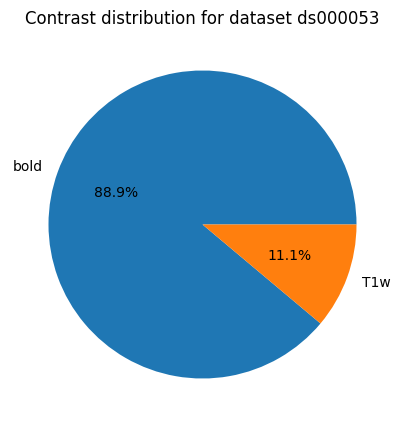

693


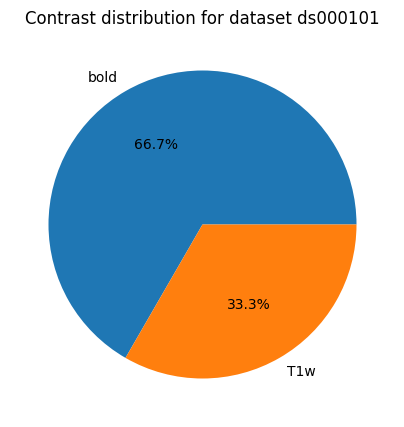

858


KeyboardInterrupt: 

<Figure size 500x500 with 0 Axes>

In [12]:
# for each dataset plot the a pie charts of the contrasts
datasets = df['dataset'].unique()
for dataset in datasets :
    plt.figure(figsize=(5,5))
    print(df[df['dataset']==dataset].size)
    plt.pie(df[df['dataset']==dataset]['contrast'].value_counts(),labels=df[df['dataset']==dataset]['contrast'].value_counts().index,autopct='%1.1f%%')
    plt.title('Contrast distribution for dataset {}'.format(dataset))
    plt.show()
    

C:\Users\bapti\AppData\Local\Temp\ipykernel_15048\3837522147.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20')
C:\Users\bapti\AppData\Local\Temp\ipykernel_15048\3837522147.py:28: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


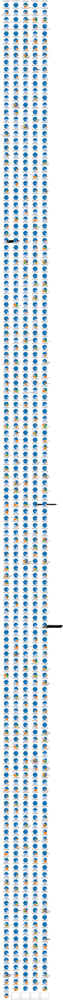

In [4]:
import matplotlib.cm as cm
datasets = df['dataset'].unique()

# create subplots
fig, axs = plt.subplots(140, 5, figsize=(15, 320))

# create a colormap
cmap = cm.get_cmap('tab20')

# iterate over datasets
for i, dataset in enumerate(datasets):
    # select the subplot
    ax = axs[i // 5, i % 5]
    
    # get the unique contrasts for the current dataset
    dataset_contrasts = df[df['dataset']==dataset]['contrast'].unique()
    
    # assign colors to contrasts using the colormap
    colors = [cmap(j) for j in range(len(dataset_contrasts))]
    
    # plot the pie chart with consistent colors
    ax.pie(df[df['dataset']==dataset]['contrast'].value_counts(), labels=df[df['dataset']==dataset]['contrast'].value_counts().index, autopct='%1.1f%%', colors=colors)
    
    # set the title
    ax.set_title('dataset {} \n with {} samples'.format(dataset, df[df['dataset']==dataset].shape[0]))

# adjust the layout
plt.tight_layout()

# show the figure
plt.show()


C:\Users\bapti\AppData\Local\Temp\ipykernel_7028\2171233768.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20')


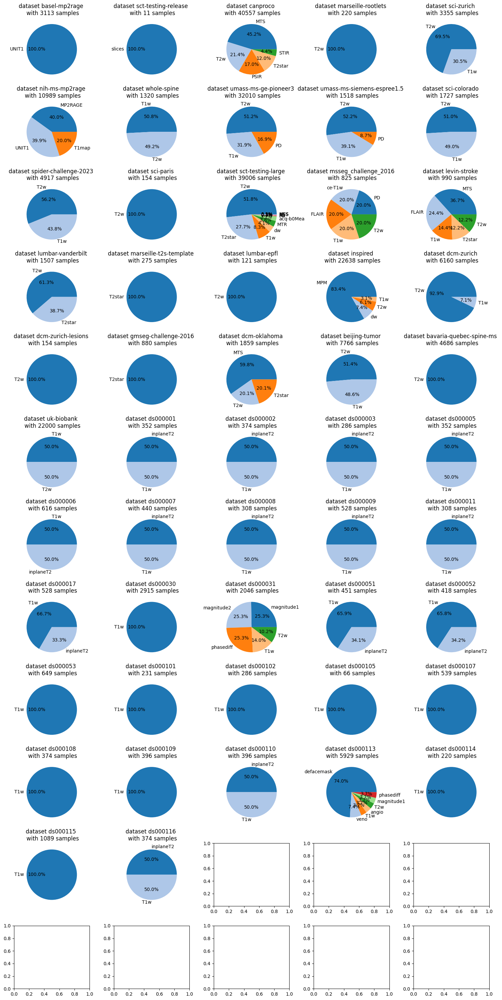

In [ ]:
# only consider 3D images
df_3D = df[df['is_3D']==1]
datasets = df_3D['dataset'].unique()

# create subplots
fig, axs = plt.subplots(12, 5, figsize=(15, 30))

# create a colormap
cmap = cm.get_cmap('tab20')

# iterate over datasets
for i, dataset in enumerate(datasets):
    # select the subplot
    ax = axs[i // 5, i % 5]
    
    # get the unique contrasts for the current dataset
    dataset_contrasts = df_3D[df_3D['dataset']==dataset]['contrast'].unique()
    
    # assign colors to contrasts using the colormap
    colors = [cmap(j) for j in range(len(dataset_contrasts))]
    
    # plot the pie chart with consistent colors
    ax.pie(df_3D[df_3D['dataset']==dataset]['contrast'].value_counts(), labels=df_3D[df_3D['dataset']==dataset]['contrast'].value_counts().index, autopct='%1.1f%%', colors=colors)
    
    # set the title
    ax.set_title('dataset {} \n with {} samples'.format(dataset, df_3D[df_3D['dataset']==dataset].size))

# adjust the layout
plt.tight_layout()

# show the figure
plt.show()


In [13]:
# only consider 3D images or unspecified dimension images (is_3D == "none")
df_3D = df[(df['is_3D']==1) | (df['is_3D']=='none')]
# mofidiy the contrats column to be insensible to case
df_3D['contrast'] = df_3D['contrast'].str.lower()

contrasts = df_3D['contrast'].unique()
contrast_count_data = []
for contrast in contrasts :
    contrast_count_data.append(df_3D[df_3D['contrast']==contrast].shape[0])

df_contrast_count_tab = pd.DataFrame(contrast_count_data, index=contrasts)
print(df_contrast_count_tab)

#save the table to a csv file
df_contrast_count_tab.to_csv('contrast_count.csv')


C:\Users\bapti\AppData\Local\Temp\ipykernel_15048\3703699678.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_3D['contrast'] = df_3D['contrast'].str.lower()


                 0
bold        135349
t1w          33736
phasediff     5192
magnitude2    4129
magnitude1    4965
...            ...
excluded       110
tb1tfl          70
megre         1050
t2starmap       34
t1wrms          34

[386 rows x 1 columns]


In [14]:
# eliminate all contrast with less than 10 samples
df_contrast_count_tab = df_contrast_count_tab[df_contrast_count_tab[0]>30]


# filter the contrast "bold" "1" and "6"
df_contrast_count_tab = df_contrast_count_tab.drop(['bold','1','6']) 

# save the table to a csv file
print(df_contrast_count_tab)
df_contrast_count_tab.to_csv('contrast_count_plusde30.csv')

                0
t1w         33736
phasediff    5192
magnitude2   4129
magnitude1   4965
t2w          6696
...           ...
excluded      110
tb1tfl         70
megre        1050
t2starmap      34
t1wrms         34

[61 rows x 1 columns]


In [15]:
# load the table from the csv file
df_contrast_count_tab = pd.read_csv('contrast_count_plusde30.csv', index_col=0)
print(df_contrast_count_tab)

                0
t1w         33736
phasediff    5192
magnitude2   4129
magnitude1   4965
t2w          6696
...           ...
excluded      110
tb1tfl         70
megre        1050
t2starmap      34
t1wrms         34

[61 rows x 1 columns]


In [16]:
# assume that each image weigth 7 mb

# print the size of the dataset with no extra filter
print('size of the dataset with no extra filter : {} mb'.format(df_3D.shape[0]*7))

# print the size of the dataset with a maximum of 5000 images per contrast
max_nb_images_per_contrast = 5000
size = 0
for contrast in df_contrast_count_tab.index:
    size += min(df_contrast_count_tab.loc[contrast][0],max_nb_images_per_contrast)
print('size of the dataset with a maximum of 5000 images per contrast : {} mb'.format(size*7))


size of the dataset with no extra filter : 1982463 mb
size of the dataset with a maximum of 5000 images per contrast : 487165 mb


C:\Users\bapti\AppData\Local\Temp\ipykernel_15048\4121664324.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  size += min(df_contrast_count_tab.loc[contrast][0],max_nb_images_per_contrast)


In [22]:
# set an empty dataframe to store the selected images path, contrast and draw probability
dataset_contrast_path = pd.DataFrame(columns=['img_path','contrast','draw_probability'])

# for each selected contrast
for contrast in df_contrast_count_tab.index:
    # get the images with the selected contrast
    df_contrast = df_3D[df_3D['contrast']==contrast]

    # set an empty dataframe to store the selected images path, contrast and draw probability
    df_selected_contrast = pd.DataFrame(columns=['img_path','contrast','draw_probability'])
    
    # get the number of images with the selected contrast
    nb_images = df_contrast.shape[0]
    
    # if the number of images is greater than the maximum number of images per contrast
    if nb_images > max_nb_images_per_contrast:
        # list the datasets that contains the selected contrast
        datasets = df_contrast['dataset'].unique()
        # count the number of images with the correct contrats per dataset
        dataset_contrast_count = []
        for dataset in datasets:
            dataset_contrast_count.append(df_contrast[df_contrast['dataset']==dataset].shape[0])
        # sort the datasets by number of images
        dataset_contrast_count = np.array(dataset_contrast_count)
        datasets = datasets[np.argsort(dataset_contrast_count)]
        # remove the datasets with less than 1 image
        datasets = datasets[dataset_contrast_count>0]

        # compute the number of images per dataset in the case of balanced dataset of datasets
        max_nb_images_per_contrast = 5000
        len_datasets = len(datasets)
        sample_per_dataset = max_nb_images_per_contrast // len(datasets)

        # parcourir le dataset
        for dataset in datasets:
            if df_contrast[df_contrast['dataset']==dataset].shape[0] < sample_per_dataset:
                # add all the images of the dataset to df_selected_contrast, keep onnly the image path and contrast
                df_selected_contrast = pd.concat([df_selected_contrast,df_contrast[df_contrast['dataset']==dataset][['img_path','contrast']].reset_index(drop=True)],axis=0)
                # update the number of images per dataset
                max_nb_images_per_contrast = max_nb_images_per_contrast - df_contrast[df_contrast['dataset']==dataset].shape[0]
                len_datasets = len_datasets - 1
                if len_datasets > 0:
                    sample_per_dataset = max_nb_images_per_contrast // len_datasets
            else:
                # add random sample to df_selected_contrast
                df_selected_contrast = pd.concat([df_selected_contrast,df_contrast[df_contrast['dataset']==dataset].sample(sample_per_dataset)[['img_path','contrast']].reset_index(drop=True)],axis=0)
    else:
        # if the number of images is less than the maximum number of images per contrast
        df_selected_contrast = df_contrast.sample(nb_images)[['img_path','contrast']].reset_index(drop=True)
    # add the selected images to the dataset_contrast_path
    dataset_contrast_path = pd.concat([dataset_contrast_path,df_selected_contrast.reset_index(drop=True)],axis=0)

# save the selected images to a csv file
dataset_contrast_path.to_csv('selected_dataset_for_3D_classifieur_0605.csv')


In [23]:
# open selected_dataset_for_3D_classifieur_0605.csv
df = pd.read_csv('selected_dataset_for_3D_classifieur_0605.csv')

#count the nulber of sample per contrast
print(df['contrast'].value_counts())

# complete the dataset with the draw probability so each contrast has the same probability to be drawn
contrasts = df['contrast'].unique()
for row in df.iterrows():
    # identify the contrast
    contrast = row[1]['contrast']
    # get the number of samples
    nb_samples = df[df['contrast']==contrast].shape[0]
    # compute the draw probability
    draw_probability = 1 / (len(contrasts) * nb_samples )
    # set the draw probability for each sample
    df.loc[df['contrast']==contrast,'draw_probability'] = draw_probability


# check that the draw probability sum to 1
print(df['draw_probability'].sum())


# save the dataset with the draw probability
df.to_csv('selected_dataset_for_3D_classifieur_0605.csv')

contrast
gre          5000
phasediff    5000
sbref        4997
ep           4994
t2w          4993
             ... 
apt            42
t1ce           42
t1mw           40
t2starmap      34
t1wrms         34
Name: count, Length: 61, dtype: int64
0.04918032786885246
